# Notice:
This notebook requires a recommended minimum of 16 GB of GPU RAM. Trying to train textual inversion with less will trigger an Out of Memory error. This Notebook is defaulted to set up to run on the RTX5000 GPU, which requires a paid account on Gradient. 

Change the URL at the top where it says "machine?=RTX5000" to any GPU with at least 16 GB of RAM to run training. The P6000, V100, V100-32G, RTX5000, A4000, A5000, A100, and A100-80G powered machines will all be able to run this training. 

You can do so by changing the following URL where it says "(YOUR-GPU-CHOICE)":

 https://console.paperspace.com/github/gradient-ai/dreambooth-stable-diffusion/blob/main/sd_dreambooth_gradient.ipynb?machine=(YOUR-GPU-CHOICE)

# Textual-inversion fine-tuning for Stable Diffusion using d🧨ffusers 

This notebook shows how to "teach" Stable Diffusion a new concept via textual-inversion using 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers). 

![Textual Inversion example](https://textual-inversion.github.io/static/images/editing/colorful_teapot.JPG)
_By using just 3-5 images you can teach new concepts to Stable Diffusion and personalize the model on your own images_ 

For a general introduction to the Stable Diffusion model please refer to this [Gradient Notebook](https://console.paperspace.com/github/gradient-ai/stable-diffusion/blob/main/stable-diffusion-notebook.ipynb?machine=A4000).


## Initial setup

In [ ]:
#@title Install the required libraries
!pip install -qq accelerate tensorboard ftfy
!pip install -qq -U transformers
!pip install -qq -U diffusers
!pip install -qq bitsandbytes
!pip install gradio

#create the directories we will use for the task
!mkdir inputs_textual_inversion

!git clone https://github.com/AUTOMATIC1111/stable-diffusion-webui

# Loading in the Stable Diffusion v1-5 models

To make accessing the Stable Diffusion models easy and not take up any storage, we have added the Stable Diffusion models v1-5 as mountable public datasets! To access the models this way, simply navigate to the "Data Sources" tab using the navigator on the far left of the page. Then click "Public" to switch into the Gradient Public Datasets, and scroll down until you find "stable-diffusion-diffusers" near the bottom of the list. Then, click "mount" to make them accessible from the "datasets" directory. This directory is in the root folder, so access it with the path `../datasets/stable-diffusion-diffusers/stable-diffusion-v1-5`

<video controls src="assets/stab-upload.mp4" />

# Alternate access: log in to HuggingFace for online access to models

In order to access the models from CompVis for Stable Diffusion, you must follow three steps:

1. You must acknowledge and agree to their user requirements and license for their models. you can do so by reading the instructions found on this page: https://huggingface.co/runwayml/stable-diffusion-v1-5

2. You must login to Huggingface, and then create and retrieve an access token (found here: https://huggingface.co/settings/tokens)

3. Finally, replace the segment of the cell below `<your_huggingface_token>` with your own token, and run the cell. 

If you follow these steps, you will be able to access the model for free!


In [ ]:
# !wget https://raw.githubusercontent.com/gradient-ai/stable-diffusion/main/login.py
# !python login.py --token <your_huggingface_token>

## Import required libraries

In [ ]:
#@title Import required libraries
import argparse
import itertools
import math
import os
import random

import numpy as np
import torch
import torch.nn.functional as F
import torch.utils.checkpoint
from torch.utils.data import Dataset

import PIL
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import set_seed
from diffusers import AutoencoderKL, DDPMScheduler, PNDMScheduler, StableDiffusionPipeline, UNet2DConditionModel
from diffusers.hub_utils import init_git_repo, push_to_hub
from diffusers.optimization import get_scheduler
from diffusers.pipelines.stable_diffusion import StableDiffusionSafetyChecker
from PIL import Image
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer


## Instantiate helper function
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Settings for teaching your new concept

When setting up your data, you can use the demo data provided below to create your first inversion. 

### Use your own data
If you would like to use your own images, hash out the cells below and add them to the `inputs` directory.

<video controls src="assets/upload.mp4" />


In [6]:
#@markdown Add here the URLs to the images of the concept you are adding. 3-5 should be fine
urls = [
      "https://datasets-server.huggingface.co/assets/valhalla/images/--/valhalla--images/train/7/image/image.jpg",
      "https://datasets-server.huggingface.co/assets/valhalla/images/--/valhalla--images/train/5/image/image.jpg",
      "https://datasets-server.huggingface.co/assets/valhalla/images/--/valhalla--images/train/6/image/image.jpg"]

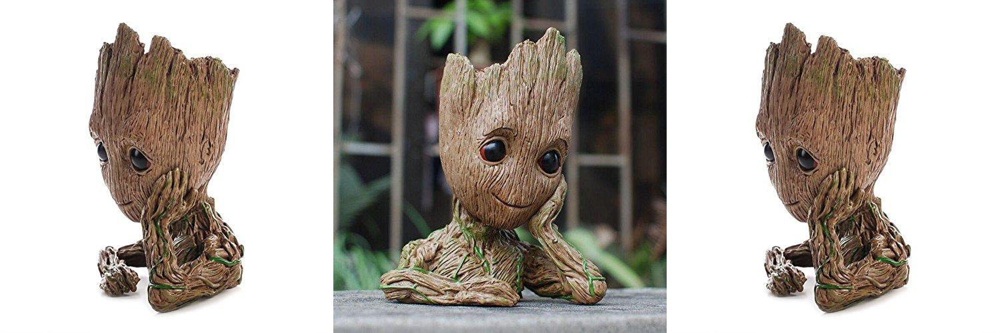

In [8]:
# @title Setup and check the images you have just added
import requests
import glob
from io import BytesIO

def download_image(url):
  try:
    response = requests.get(url)
  except:
    return None
  return Image.open(BytesIO(response.content)).convert("RGB")

images = list(filter(None,[download_image(url) for url in urls]))
save_path = "./inputs_textual_inversion"
if not os.path.exists(save_path):
  os.mkdir(save_path)
[image.save(f"{save_path}/{i}.jpeg") for i, image in enumerate(images)]
image_grid(images, 1, len(images))

## What to teach: appropriately name your concept and token

For the example, since our images are of a toy Groot from Guardians of the Galaxy, we can name our concept "grooty" and our token "groot"

In [9]:
#@markdown `initializer_token` is a word that can summarise what your new concept is, to be used as a starting point
concept_name = "grooty"
initializer_token = "groot" #@param {type:"string"}


In [10]:
#@title Settings for your newly created concept
#@markdown `what_to_teach`: what is it that you are teaching? `object` enables you to teach the model a new object to be used, `style` allows you to teach the model a new style one can use.
what_to_teach = "object" #@param ["object", "style"]
#@markdown `placeholder_token` is the token you are going to use to represent your new concept (so when you prompt the model, you will say "A `<my-placeholder-token>` in an amusement park"). We use angle brackets to differentiate a token from other words/tokens, to avoid collision.
placeholder_token = f'<{concept_name}>'


## Teach the model a new concept (fine-tuning with textual inversion)
Execute this this sequence of cells to run the training process. The whole process may take from 1-4 hours. (Open this block if you are interested in how this process works under the hood or if you want to change advanced training settings or hyperparameters)

### Create Dataset

In [21]:
#@title Setup the prompt templates for training 
imagenet_templates_small = [
    "a photo of a {}",
    "a rendering of a {}",
    "a cropped photo of the {}",
    "the photo of a {}",
    "a photo of a clean {}",
    "a photo of a dirty {}",
    "a dark photo of the {}",
    "a photo of my {}",
    "a photo of the cool {}",
    "a close-up photo of a {}",
    "a bright photo of the {}",
    "a cropped photo of a {}",
    "a photo of the {}",
    "a good photo of the {}",
    "a photo of one {}",
    "a close-up photo of the {}",
    "a rendition of the {}",
    "a photo of the clean {}",
    "a rendition of a {}",
    "a photo of a nice {}",
    "a good photo of a {}",
    "a photo of the nice {}",
    "a photo of the small {}",
    "a photo of the weird {}",
    "a photo of the large {}",
    "a photo of a cool {}",
    "a photo of a small {}",
]

imagenet_style_templates_small = [
    "a painting in the style of {}",
    "a rendering in the style of {}",
    "a cropped painting in the style of {}",
    "the painting in the style of {}",
    "a clean painting in the style of {}",
    "a dirty painting in the style of {}",
    "a dark painting in the style of {}",
    "a picture in the style of {}",
    "a cool painting in the style of {}",
    "a close-up painting in the style of {}",
    "a bright painting in the style of {}",
    "a cropped painting in the style of {}",
    "a good painting in the style of {}",
    "a close-up painting in the style of {}",
    "a rendition in the style of {}",
    "a nice painting in the style of {}",
    "a small painting in the style of {}",
    "a weird painting in the style of {}",
    "a large painting in the style of {}",
]

In [22]:
#@title Setup the dataset
class TextualInversionDataset(Dataset):
    def __init__(
        self,
        data_root,
        tokenizer,
        learnable_property="object",  # [object, style]
        size=512,
        repeats=100,
        interpolation="bicubic",
        flip_p=0.5,
        set="train",
        placeholder_token="*",
        center_crop=False,
    ):

        self.data_root = data_root
        self.tokenizer = tokenizer
        self.learnable_property = learnable_property
        self.size = size
        self.placeholder_token = placeholder_token
        self.center_crop = center_crop
        self.flip_p = flip_p

        self.image_paths = [os.path.join(self.data_root, file_path) for file_path in os.listdir(self.data_root)]

        self.num_images = len(self.image_paths)
        self._length = self.num_images

        if set == "train":
            self._length = self.num_images * repeats

        self.interpolation = {
            "linear": PIL.Image.LINEAR,
            "bilinear": PIL.Image.BILINEAR,
            "bicubic": PIL.Image.BICUBIC,
            "lanczos": PIL.Image.LANCZOS,
        }[interpolation]

        self.templates = imagenet_style_templates_small if learnable_property == "style" else imagenet_templates_small
        self.flip_transform = transforms.RandomHorizontalFlip(p=self.flip_p)

    def __len__(self):
        return self._length

    def __getitem__(self, i):
        example = {}
        image = Image.open(self.image_paths[i % self.num_images])

        if not image.mode == "RGB":
            image = image.convert("RGB")

        placeholder_string = self.placeholder_token
        text = random.choice(self.templates).format(placeholder_string)

        example["input_ids"] = self.tokenizer(
            text,
            padding="max_length",
            truncation=True,
            max_length=self.tokenizer.model_max_length,
            return_tensors="pt",
        ).input_ids[0]

        # default to score-sde preprocessing
        img = np.array(image).astype(np.uint8)

        if self.center_crop:
            crop = min(img.shape[0], img.shape[1])
            h, w, = (
                img.shape[0],
                img.shape[1],
            )
            img = img[(h - crop) // 2 : (h + crop) // 2, (w - crop) // 2 : (w + crop) // 2]

        image = Image.fromarray(img)
        image = image.resize((self.size, self.size), resample=self.interpolation)

        image = self.flip_transform(image)
        image = np.array(image).astype(np.uint8)
        image = (image / 127.5 - 1.0).astype(np.float32)

        example["pixel_values"] = torch.from_numpy(image).permute(2, 0, 1)
        return example

### Setting up the model

In [ ]:
#@title Load the Stable Diffusion model

#@markdown set `pretrained_model_name_or_path` to which Stable Diffusion checkpoint you want to use

## Use local files
pretrained_model_name_or_path = "../datasets/stable-diffusion-diffusers/stable-diffusion-v1-5" #@param {type:"string"}

## Download online files
#@markdown Please read and, if you agree, accept the LICENSE [here](https://huggingface.co/runwayml/stable-diffusion-v1-5) if you see an error
# pretrained_model_name_or_path = "runwayml/stable-diffusion-v1-5" #@param {type:"string"}

In [ ]:
#@title Load the tokenizer and add the placeholder token as a additional special token.
#@markdown Please read and, if you agree, accept the LICENSE [here](https://huggingface.co/runwayml/stable-diffusion-v1-5) if you see an error
tokenizer = CLIPTokenizer.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="tokenizer")

# Add the placeholder token in tokenizer
num_added_tokens = tokenizer.add_tokens(placeholder_token)
if num_added_tokens == 0:
    raise ValueError(
        f"The tokenizer already contains the token {placeholder_token}. Please pass a different"
        " `placeholder_token` that is not already in the tokenizer."
    )

In [15]:
#@title Get token ids for our placeholder and initializer token. This code block will complain if initializer string is not a single token
# Convert the initializer_token, placeholder_token to ids
token_ids = tokenizer.encode(initializer_token, add_special_tokens=False)
# Check if initializer_token is a single token or a sequence of tokens
if len(token_ids) > 1:
    raise ValueError("The initializer token must be a single token.")

initializer_token_id = token_ids[0]
placeholder_token_id = tokenizer.convert_tokens_to_ids(placeholder_token)

In [ ]:
#@title Load the Stable Diffusion model
# Load models and create wrapper for stable diffusion
text_encoder = CLIPTextModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="text_encoder",

)
vae = AutoencoderKL.from_pretrained(
    pretrained_model_name_or_path, subfolder="vae",

)
unet = UNet2DConditionModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="unet",

)

Since we have added the `placeholder_token` in the `tokenizer`, we need to re-size the token embeddings here, and create a new embedding vector in the token embeddings for our `placeholder_token`.

In [23]:
text_encoder.resize_token_embeddings(len(tokenizer))

Embedding(49409, 768)

 Initialise the newly added placeholder token with the embeddings of the initializer token

In [24]:
token_embeds = text_encoder.get_input_embeddings().weight.data
token_embeds[placeholder_token_id] = token_embeds[initializer_token_id]

Since we are only training the newly added embedding vector, we can then freeze the rest of the model parameters here

In [25]:
def freeze_params(params):
    for param in params:
        param.requires_grad = False

# Freeze vae and unet
freeze_params(vae.parameters())
freeze_params(unet.parameters())
# Freeze all parameters except for the token embeddings in text encoder
params_to_freeze = itertools.chain(
    text_encoder.text_model.encoder.parameters(),
    text_encoder.text_model.final_layer_norm.parameters(),
    text_encoder.text_model.embeddings.position_embedding.parameters(),
)
freeze_params(params_to_freeze)

### Creating our training data

Let's create the Dataset and Dataloader

In [ ]:
train_dataset = TextualInversionDataset(
      data_root=save_path,
      tokenizer=tokenizer,
      size=512,
      placeholder_token=placeholder_token,
      repeats=100,
      learnable_property=what_to_teach, #Option selected above between object and style
      center_crop=False,
      set="train",
)

In [30]:
def create_dataloader(train_batch_size=16):
    return torch.utils.data.DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True)

Create noise_scheduler for training

In [31]:
noise_scheduler = DDPMScheduler(
    beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000
)

Define hyperparameters for our training
If you are not happy with your results, you can tune the `learning_rate` and the `max_train_steps`

In [32]:
hyperparameters = {
    "learning_rate": 5e-04,
    "scale_lr": True,
    "max_train_steps": 3000,
    "train_batch_size": 1,
    "gradient_accumulation_steps": 1,
    "seed": 42,
    "output_dir": f'/notebooks/concepts/{concept_name}-concept',
}

Define the training_function

In [33]:
def training_function(text_encoder, vae, unet):
    logger = get_logger(__name__)

    train_batch_size = hyperparameters["train_batch_size"]
    gradient_accumulation_steps = hyperparameters["gradient_accumulation_steps"]
    learning_rate = hyperparameters["learning_rate"]
    max_train_steps = hyperparameters["max_train_steps"]
    output_dir = hyperparameters["output_dir"]

    accelerator = Accelerator(
        gradient_accumulation_steps=gradient_accumulation_steps,
        # distributed_type='MULTI_GPU' 
        # distribute_type: Accelerate.DistributedType.MULTI_GPU
        # fp16=True,
        # cpu=True,
    )

    train_dataloader = create_dataloader(train_batch_size)

    if hyperparameters["scale_lr"]:
        learning_rate = (
            learning_rate * gradient_accumulation_steps * train_batch_size * accelerator.num_processes
        )

    # Initialize the optimizer
    optimizer = torch.optim.AdamW(
        text_encoder.get_input_embeddings().parameters(),  # only optimize the embeddings
        lr=learning_rate,
    )


    text_encoder, optimizer, train_dataloader = accelerator.prepare(
        text_encoder, optimizer, train_dataloader
    )

    # Move vae and unet to device
    vae.to(accelerator.device)
    unet.to(accelerator.device)

    # Keep vae and unet in eval model as we don't train these
    vae.eval()
    unet.eval()

    # We need to recalculate our total training steps as the size of the training dataloader may have changed.
    num_update_steps_per_epoch = math.ceil(len(train_dataloader) / gradient_accumulation_steps)
    num_train_epochs = math.ceil(max_train_steps / num_update_steps_per_epoch)

    # Train!
    total_batch_size = train_batch_size * accelerator.num_processes * gradient_accumulation_steps

    logger.info("***** Running training *****")
    logger.info(f"  Num examples = {len(train_dataset)}")
    logger.info(f"  Instantaneous batch size per device = {train_batch_size}")
    logger.info(f"  Total train batch size (w. parallel, distributed & accumulation) = {total_batch_size}")
    logger.info(f"  Gradient Accumulation steps = {gradient_accumulation_steps}")
    logger.info(f"  Total optimization steps = {max_train_steps}")
    # Only show the progress bar once on each machine.
    progress_bar = tqdm(range(max_train_steps), disable=not accelerator.is_local_main_process)
    progress_bar.set_description("Steps")
    global_step = 0

    for epoch in range(num_train_epochs):
        text_encoder.train()
        for step, batch in enumerate(train_dataloader):
            with accelerator.accumulate(text_encoder):
                # Convert images to latent space
                latents = vae.encode(batch["pixel_values"]).latent_dist.sample().detach()
                latents = latents * 0.18215

                # Sample noise that we'll add to the latents
                noise = torch.randn(latents.shape).to(latents.device)
                bsz = latents.shape[0]
                # Sample a random timestep for each image
                timesteps = torch.randint(0, noise_scheduler.num_train_timesteps, (bsz,), device=latents.device).long()

                # Add noise to the latents according to the noise magnitude at each timestep
                # (this is the forward diffusion process)
                noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

                # Get the text embedding for conditioning
                encoder_hidden_states = text_encoder(batch["input_ids"])[0]

                # Predict the noise residual
                noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample

                loss = F.mse_loss(noise_pred, noise, reduction="none").mean([1, 2, 3]).mean()
                accelerator.backward(loss)

                # Zero out the gradients for all token embeddings except the newly added
                # embeddings for the concept, as we only want to optimize the concept embeddings
                if accelerator.num_processes > 1:
                    grads = text_encoder.module.get_input_embeddings().weight.grad
                else:
                    grads = text_encoder.get_input_embeddings().weight.grad
                # Get the index for tokens that we want to zero the grads for
                index_grads_to_zero = torch.arange(len(tokenizer)) != placeholder_token_id
                grads.data[index_grads_to_zero, :] = grads.data[index_grads_to_zero, :].fill_(0)

                optimizer.step()
                optimizer.zero_grad()

            # Checks if the accelerator has performed an optimization step behind the scenes
            if accelerator.sync_gradients:
                progress_bar.update(1)
                global_step += 1

            logs = {"loss": loss.detach().item()}
            progress_bar.set_postfix(**logs)

            if global_step >= max_train_steps:
                break

        accelerator.wait_for_everyone()


    # Create the pipeline using using the trained modules and save it.
    if accelerator.is_main_process:
        pipeline = StableDiffusionPipeline(
            text_encoder=accelerator.unwrap_model(text_encoder),
            vae=AutoencoderKL.from_pretrained(pretrained_model_name_or_path, subfolder="vae",),
            unet=UNet2DConditionModel.from_pretrained(pretrained_model_name_or_path, subfolder="unet",),
            tokenizer=tokenizer,
            scheduler=PNDMScheduler(
                beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", skip_prk_steps=True
            ),
            safety_checker=StableDiffusionSafetyChecker.from_pretrained("CompVis/stable-diffusion-safety-checker"),
            feature_extractor=CLIPFeatureExtractor.from_pretrained("openai/clip-vit-base-patch32"),
        )
        pipeline.save_pretrained(output_dir)
        # Also save the newly trained embeddings
        learned_embeds = accelerator.unwrap_model(accelerator.unwrap_model(text_encoder)).get_input_embeddings().weight[placeholder_token_id]
        learned_embeds_dict = {placeholder_token: learned_embeds.detach().cpu()}
        torch.save(learned_embeds_dict, os.path.join(output_dir, "learned_embeds.bin"))

## Run training

In [ ]:
import accelerate

# torch.multiprocessing.set_start_method('spawn')

# accelerate.notebook_launcher(training_function, args=(text_encoder, vae, unet), num_processes=0, use_fp16= True)
accelerate.notebook_launcher(training_function, args=(text_encoder, vae, unet), num_processes=1)

## Run inference code with your newly trained embedding
If you have just trained your model with the code above, use the block below to run it

To save this concept for re-using, download the `learned_embeds.bin` file or save it on the library of concepts.

Use the [Stable Conceptualizer notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_conceptualizer_inference.ipynb) for inference with persistently saved pre-trained concepts

In [35]:
#@title Set up the pipeline 
pipe = StableDiffusionPipeline.from_pretrained(
    hyperparameters["output_dir"],
    # "downloaded_embedding",
    torch_dtype=torch.float16,
    device_map="auto",
).to("cuda")

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

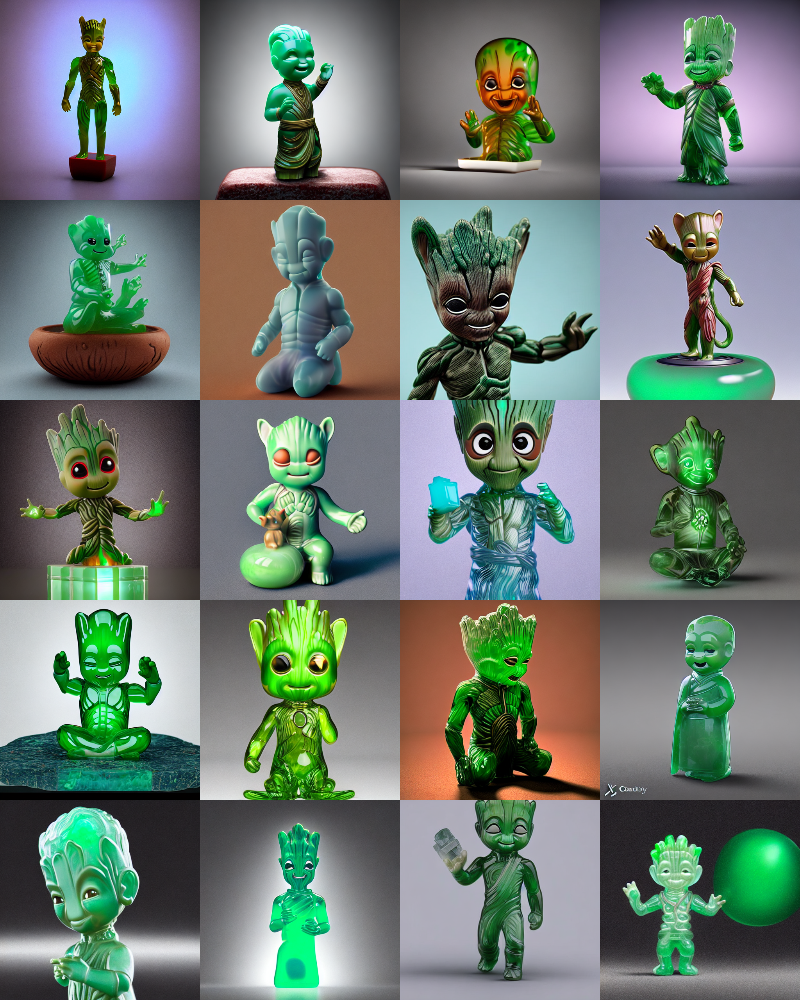

In [36]:
#@title Run the Stable Diffusion pipeline
#@markdown Don't forget to use the placeholder token in your prompt

prompt = f"a translucent jade chinese figurine of {placeholder_token}, HDR, productshot render, Cinema4D, caustics" #@param {type:"string"}

num_samples = 5 #@param {type:"number"}
num_rows = 4 #@param {type:"number"}

# prevent safety checking
def dummy(images, **kwargs):
    return images, False
pipe.safety_checker = dummy

all_images = [] 
for _ in range(num_rows):
    images = pipe([prompt] * num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid 

# Using your new embedding with Stable Diffusion Web UI

Now that we have our new embedding, we simply need to move it to the Web UI's embeddings folder.

First, locate your 'learned_embed.bin' file in the concept folder. 

Second, you will want to rename it to something reflecting your concept. I chose 'grooty.bin'

Third, move the file to the webui embeddings folder and launch.

Then use your placeholder token in any prompt to get your embedding featured! Use the cell below to do so for this demo

> Note: You need to have cloned the webui repo to this Notebook's workspace first. Use the cell at the top of this page to clone & run the Web UI from this notebook. 

In [ ]:
!mv concepts/grooty-concept/learned_embeds.bin stable-diffusion-webui/embeddings/grooty.bin

# Run the Stable Diffusion Web UI

Now that our embedding is in the right place, we can run the cell below to setup and launch the Automatic1111 Stable Diffusion Web UI from this Notebook. Click the Gradio link after the setup completes to access the Web UI in your local browser. 

> Note: Be sure to check out the Dreambooth notebook before continuing! You need a checkpoint file in the `stable-diffusion-webui/models/Stable-diffusion` directory to launch the Web UI


# Loading in the Stable Diffusion v1-5 models for the Web UI 

To make accessing the Stable Diffusion models easy and not take up any storage, we have added the Stable Diffusion models v1-5 as mountable public datasets! 

First, navigate to the "Data Sources" tab using the navigator on the far left of the page.

Next, click "Public" to switch into the Gradient Public Datasets, and scroll down until you find "stable-diffusion-classic" near the bottom of the list. 

Finally, click "mount" to make them accessible from the "datasets" directory. This directory is in the root folder, so access it with the path `~/../datasets/stable-diffusion-classic/v1-5-pruned-emaonly.ckpt`

In [ ]:
%cd stable-diffusion-webui
# launch the webui
!python launch.py --share --ckpt ../../datasets/stable-diffusion-classic/v1-5-pruned-emaonly.ckpt


## Upload your concept to the Huggingface concepts library

In [149]:
#@title Save your newly created concept to the [library of concepts](https://huggingface.co/sd-concepts-library)?

# save_concept_to_public_library = False #@param {type:"boolean"}
# name_of_your_concept = concept_name #@param {type:"string"}
# #@markdown `hf_token_write`: leave blank if you logged in with a token with `write access` in the [Initial Setup](#scrollTo=KbzZ9xe6dWwf). If not, [go to your tokens settings and create a write access token](https://huggingface.co/settings/tokens)
# hf_token_write = "" #@param {type:"string"}

# if(save_concept_to_public_library):
#   from slugify import slugify
#   from huggingface_hub import HfApi, HfFolder, CommitOperationAdd
#   from huggingface_hub import create_repo
#   # repo_id = f"sd-concepts-library/{slugify(name_of_your_concept)}"
#   repo_id = f"hilmes/{slugify(name_of_your_concept)}"

#   output_dir = hyperparameters["output_dir"]
#   if(not hf_token_write):
#     with open(HfFolder.path_token, 'r') as fin: hf_token = fin.read();
#   else:
#     hf_token = hf_token_write
#   #Join the Concepts Library organization if you aren't part of it already
#   # !curl -X POST -H 'Authorization: Bearer '$hf_token -H 'Content-Type: application/json' https://huggingface.co/organizations/sd-concepts-library/share/VcLXJtzwwxnHYCkNMLpSJCdnNFZHQwWywv
#   images_upload = os.listdir(save_path)
#   image_string = ""
#   repo_id = f"hilmes/{slugify(name_of_your_concept)}"
#   for i, image in enumerate(images_upload):
#       image_string = f'''{image_string}![{placeholder_token} {i}](https://huggingface.co/{repo_id}/resolve/main/concept_images/{image})
# '''
#   if(what_to_teach == "style"):
#       what_to_teach_article = f"a `{what_to_teach}`"
#   else:
#       what_to_teach_article = f"an `{what_to_teach}`"
#   readme_text = f'''---
# license: mit
# ---
# ### {name_of_your_concept} on Stable Diffusion
# This is the `{placeholder_token}` concept taught to Stable Diffusion via Textual Inversion. You can load this concept into the [Stable Conceptualizer](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_conceptualizer_inference.ipynb) notebook. You can also train your own concepts and load them into the concept libraries using [this notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/sd_textual_inversion_training.ipynb).

# Here is the new concept you will be able to use as {what_to_teach_article}:
# {image_string}
# '''
#   #Save the readme to a file
#   readme_file = open("README.md", "w")
#   readme_file.write(readme_text)
#   readme_file.close()
#   #Save the token identifier to a file
#   text_file = open("token_identifier.txt", "w")
#   text_file.write(placeholder_token)
#   text_file.close()
#   #Save the type of teached thing to a file
#   type_file = open("type_of_concept.txt","w")
#   type_file.write(what_to_teach)
#   type_file.close()
#   operations = [
#     CommitOperationAdd(path_in_repo="learned_embeds.bin", path_or_fileobj=f"{output_dir}/learned_embeds.bin"),
#     CommitOperationAdd(path_in_repo="token_identifier.txt", path_or_fileobj="token_identifier.txt"),
#     CommitOperationAdd(path_in_repo="type_of_concept.txt", path_or_fileobj="type_of_concept.txt"),
#     CommitOperationAdd(path_in_repo="README.md", path_or_fileobj="README.md"),
#   ]
#   # create_repo(repo_id,private=True, token=hf_token)
#   create_repo(repo_id,private=True)

#   api = HfApi()
#   api.create_commit(
#     repo_id=repo_id,
#     operations=operations,
#     commit_message=f"Upload the concept {name_of_your_concept} embeds and token",
#     token=hf_token
#   )
#   api.upload_folder(
#     folder_path=save_path,
#     path_in_repo="concept_images",
#     repo_id=repo_id,
#     token=hf_token
#   )